# Lab 1 (`dasio` edition): DAS Basics

A rewrite of `Basic_DAS_data.ipynb` using the standalone
[**`dasio`**](https://github.com/jxli2a/dasio) package for all DAS I/O and processing,
runnable in the lightweight **`dasio` conda env**. It mirrors the original — local
earthquake, teleseism, maps, travel times, image & wiggle plots.

Maps use a **single** stack (`cartopy`) for both the local and the global view

## 0. Setup & data

Installs **`dasio`** from source — `git clone` + `pip install -e 'dasio[noise,pick]'`
(it isn't on PyPI; the `noise`/`pick` extras pull **PyTorch** and **`phasenet`**, and
dasio's core deps come from its `pyproject`) — plus `gdown`, `cartopy`, `obspy`, then
downloads the example data (raw `.h5` + channel CSV + fault shapefile) into `../Inputs`.
`!` shell magics are replaced with `subprocess` so this runs both interactively and under `python`.

In [ ]:
import importlib.util, os, subprocess, sys

# dasio isn't on PyPI. If it's not already in the env (e.g. baked into the workshop
# image), install it from source, editable -- the noise/pick extras pull PyTorch and
# phasenet; dasio's core deps come from its pyproject.
if importlib.util.find_spec("dasio") is None:
    if not os.path.isdir("dasio"):
        subprocess.run(["git", "clone", "-q", "https://github.com/jxli2a/dasio.git"], check=True)
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "-e", "dasio[noise,pick]"], check=True)
    # extras the base env may not ship + example data
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "gdown", "cartopy", "obspy"], check=True)
# download the DAS data
subprocess.run(
    ["gdown", "--folder",
    "https://drive.google.com/drive/folders/14OFsSMAAiQQ3B4jzutzDPhnKL-8B9eDs?usp=sharing",
    "-O", "../Inputs"],
    check=True,
)

In [1]:
import datetime
from datetime import timedelta
from dateutil.parser import parse
from dataclasses import replace

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams.update({"image.cmap": "seismic", "font.size": 14})

from obspy.taup import TauPyModel
from obspy.geodetics import locations2degrees, gps2dist_azimuth

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import Reader

import dasio
from dasio import DASFile, DASdb
print("dasio", dasio.__version__, "| cartopy", cartopy.__version__)

FIGSIZE = (20, 12)                                            # waterfall size
FAULTS  = "../Inputs/Qfaults_GIS_clipped/Qfaults_clipped.shp"  # USGS Quaternary faults


def geo_map(extent=None, figsize=(12, 10), faults=None, ax=None):
    """One unified basemap for both the local and the global view.

    Draws coastlines, land/ocean, country & state borders and lakes from
    cartopy's Natural Earth features (downloaded and cached on first use),
    optionally overlays a fault-line shapefile, and returns the GeoAxes.
    Plot lon/lat data on it with `transform=ccrs.PlateCarree()`, or
    `transform=ccrs.Geodetic()` for true great-circle paths.

    Parameters
    ----------
    extent : [lon_min, lon_max, lat_min, lat_max], or None for a global map.
    faults : path to a line shapefile (e.g. USGS Quaternary faults) to overlay.
    ax     : existing GeoAxes to draw into; a new figure/axes is made if None.
    """
    proj = ccrs.PlateCarree()
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(1, 1, 1, projection=proj)
        ax.set_position([0.08, 0.04, 0.85, 0.92])  # left, bottom, width, height
    ax.set_global() if extent is None else ax.set_extent(extent, crs=proj)
    ax.add_feature(cfeature.OCEAN, facecolor="#d6ecff")
    ax.add_feature(cfeature.LAND, facecolor="#f3efe6")
    ax.add_feature(cfeature.LAKES, facecolor="#d6ecff", edgecolor="none")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.STATES, linewidth=0.3, edgecolor="0.5")
    if faults is not None:
        ax.add_geometries(Reader(faults).geometries(), crs=proj,
                          edgecolor="firebrick", facecolor="none",
                          linewidth=0.7, alpha=0.8)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, color="0.6", alpha=0.5)
    gl.top_labels = gl.right_labels = False
    return ax

dasio 0.1.0 | cartopy 0.25.0


## 1. Channel geometry

In [2]:
array_df = pd.read_csv("../Inputs/Ridgecrest-DAS-100km_South.csv")
good     = array_df[array_df["status"] == "good"]
good_ch  = good["channel"].dropna().astype(int).to_numpy()
ch_lat   = good["latitude"].dropna().astype(float).to_numpy()
ch_lon   = good["longitude"].dropna().astype(float).to_numpy()
print(good_ch.size, "good channels  (index", good_ch.min(), "..", good_ch.max(), ")")

8669 good channels  (index 18 .. 9149 )


## 2. Local earthquake — M3.0  (single file → `DASFile`)

USGS [ci41154263](https://earthquake.usgs.gov/earthquakes/eventpage/ci41154263/executive).

In [3]:
ev = dict(lat=35.660, lon=-117.538, dep=9.2, mag=3.0, time="2026-01-08 05:28:06Z")
eqTime = parse(ev["time"])

### Map — array, epicenter, faults  (`geo_map`)

Text(0.5, 1.0, 'Ridgecrest South DAS — local M3.0 earthquake')

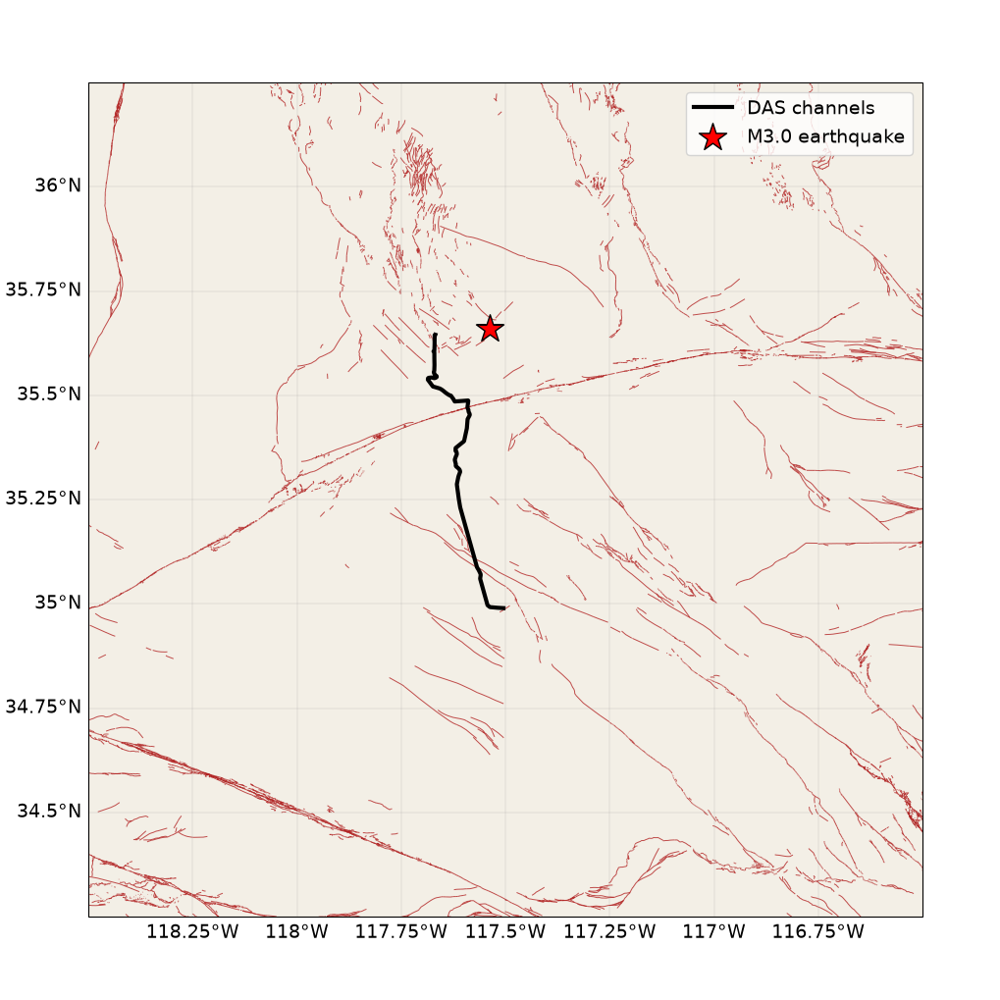

In [4]:
ax = geo_map(extent=[-118.5, -116.5, 34.25, 36.25], figsize=(10, 10), faults=FAULTS)
ax.plot(ch_lon, ch_lat, "k-", lw=3, transform=ccrs.PlateCarree(), label="DAS channels")
ax.scatter(ev["lon"], ev["lat"], c="r", s=ev["mag"]*150, marker="*", edgecolors="k",
           zorder=5, transform=ccrs.PlateCarree(), label="M%.1f earthquake" % ev["mag"])
ax.legend(loc="upper right")
ax.set_title("Ridgecrest South DAS — local M%.1f earthquake" % ev["mag"])

### Read & convert

`DASFile` detects the format/origin; these are `Proc` (processed OptaSense) files, so
`read()` returns **microstrain**. We read the **whole file** (no `first_sample`/`n_samples`),
`select_channels`, then set `t0_sec` so sample 0 is referenced to the origin time — the
event sits at `t = 0` and plots window by time in seconds.

In [5]:
fn = "../Inputs/RidgeCrest-South-2026-01-08T050503Z.h5"
f  = DASFile(fn)
print("system:", f.system, "| origin:", f.origin)            # Proc | OptaSense

d = f.read()                                                 # whole 30-min file
d = d.select_channels(good_ch)
d = replace(d, t0_sec=(d.begin_time - eqTime).total_seconds())  # event at t = 0
print("units:", d.units, "| shape:", d.shape)
d.info

system: Proc | origin: OptaSense


units: microstrain | shape: (8669, 180000)


{'fs': 100.0,
 'dt': 0.01,
 'nt': 180000,
 'nx': 8669,
 'dx': 10.209524154663086,
 'begin_time': datetime.datetime(2026, 1, 8, 5, 5, 3, 50000, tzinfo=datetime.timezone.utc),
 'end_time': datetime.datetime(2026, 1, 8, 5, 35, 3, 40000, tzinfo=datetime.timezone.utc),
 't0_sec': -1382.95,
 'gauge_length_m': 102.0952377319336,
 'system': 'OptaSense',
 'units': 'microstrain'}

In [6]:
dloc = d.truncate(t_range=(-30.0, 120.0))                    # event window, in seconds

### `dloc.plot()` — strain (dominated by drift)

Text(0.5, 1.0, 'M3.0 local earthquake — strain (raw)')

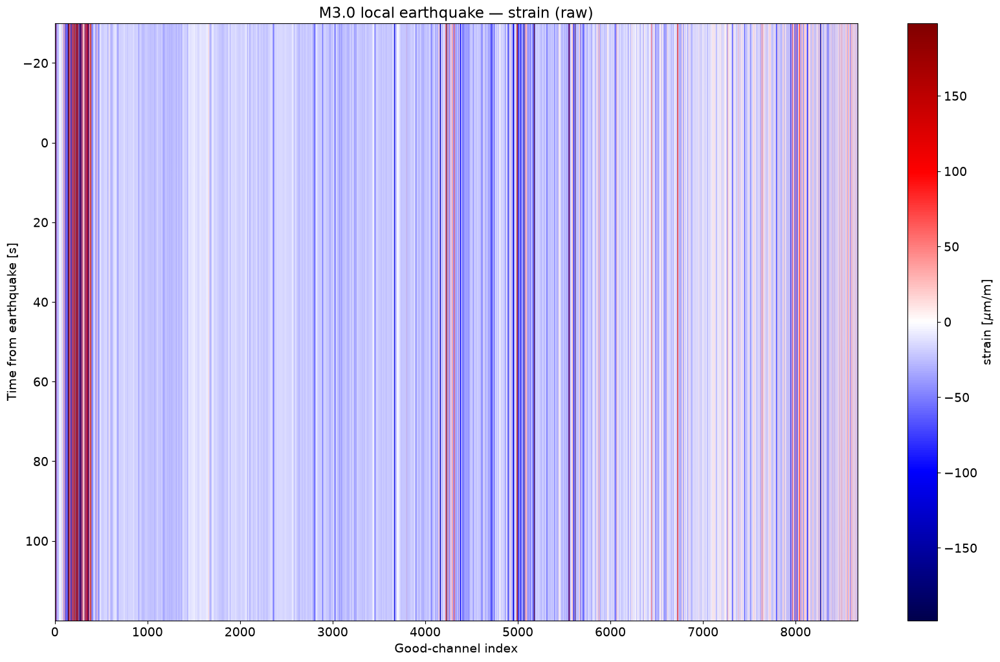

In [7]:
ax, im = dloc.plot(figsize=FIGSIZE)
ax.set_xlabel("Good-channel index"); ax.set_ylabel("Time from earthquake [s]")
im.colorbar.set_label("strain [$\\mu$m/m]")
ax.set_title("M3.0 local earthquake — strain (raw)")

### `dloc.differentiate().plot()` — strain rate (earthquake revealed)

Text(0.5, 1.0, 'M3.0 local earthquake — strain rate')

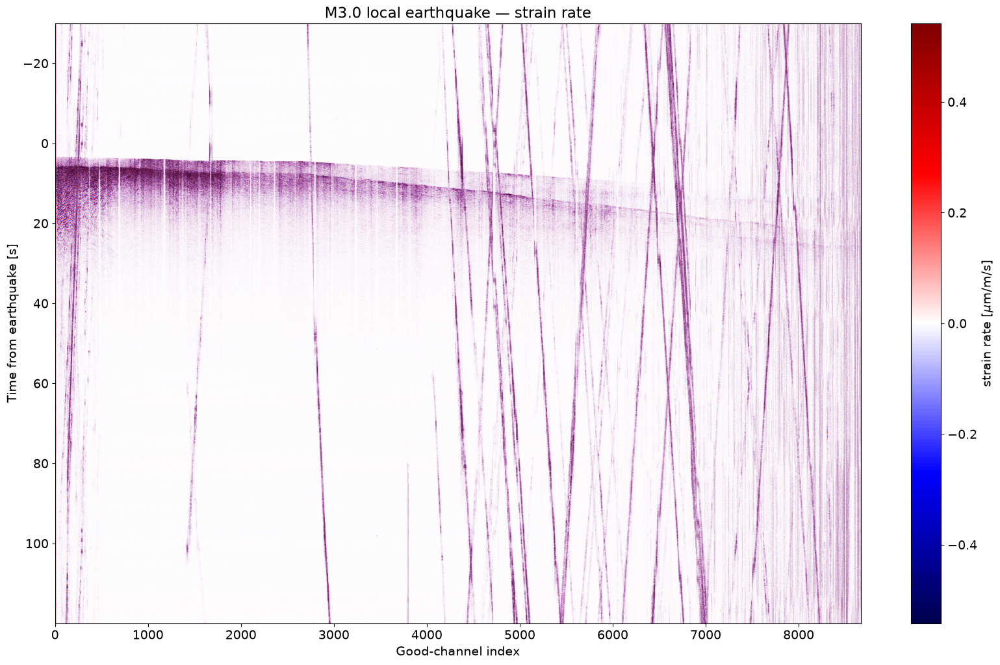

In [8]:
ax, im = dloc.differentiate().plot(figsize=FIGSIZE)
ax.set_xlabel("Good-channel index"); ax.set_ylabel("Time from earthquake [s]")
im.colorbar.set_label("strain rate [$\\mu$m/m/s]")
ax.set_title("M3.0 local earthquake — strain rate")

### Wiggle

Text(0.5, 1.0, 'Wiggle — strain rate, 0.5-10 Hz')

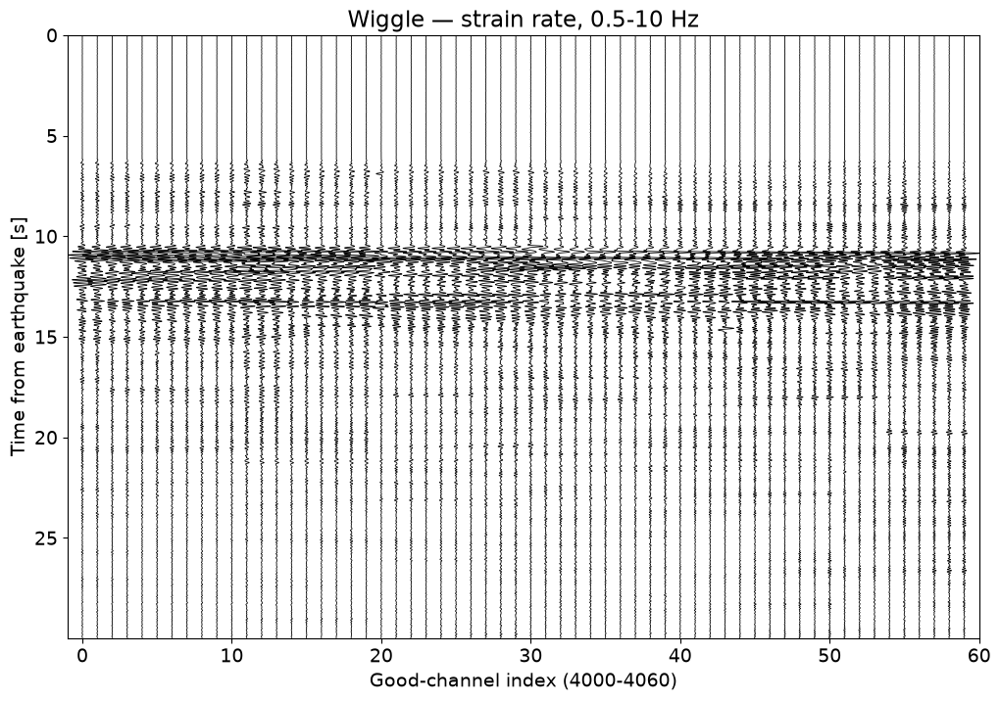

In [9]:
dr = d.truncate(ch_range=(4000, 4060), t_range=(-5.0, 35.0)).differentiate().bandpass(0.5, 10.0)
ax = dr.plot.wiggle(t_range=(0.0, 30.0), figsize=(12, 8))
ax.set_xlabel("Good-channel index (4000-4060)"); ax.set_ylabel("Time from earthquake [s]")
ax.set_title("Wiggle — strain rate, 0.5-10 Hz")

### PhaseNet-DAS — automatic P/S picks

`dasio.pick_phases` runs the **PhaseNet-DAS+** deep-learning picker on the
**strain-rate** field (the quantity it is trained on) and returns a `Picks`
object — a tidy `(channel, phase, sample, time, prob)` DataFrame with a
lightweight `.plot()` (channel vs. time). The data is fed verbatim; the model
self-normalizes, so no band-pass or common-mode removal beforehand. The window
the model sees (`nx_win`, `nt_win`), the patch overlap, the edge tapers and the
probability threshold are all passed explicitly below so the inference settings
are visible. Picking needs the optional `pip install 'dasio[pick]'` extra
(PyTorch + `phasenet`) and a GPU; weights download once and cache under
`~/.cache/phasenet`.

Picks(8927 P, 7315 S over 8669 ch, phasenet-das+)


Text(0.5, 1.0, 'M3.0 local earthquake — PhaseNet-DAS+ P/S picks')

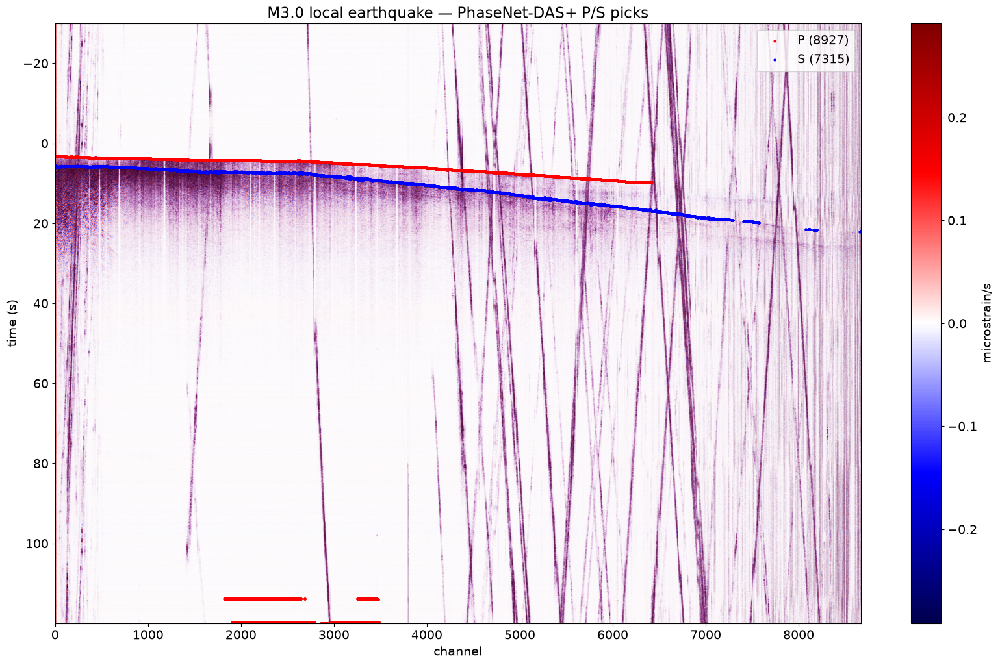

In [10]:
from dasio import pick_phases

NX_DAS, NT_DAS = 2048, 4096          # spatial / temporal patch the model sees
MIN_PROB = 0.3                       # keep picks above this phase probability

dloc_sr = dloc.differentiate()       # strain rate = PhaseNet-DAS input (it self-normalizes)
picks_loc = pick_phases(
    dloc_sr, model="phasenet-das+",
    nx_win=NX_DAS, nt_win=NT_DAS,
    min_t_overlap=0.1, taper_nx=True, taper_nt=True,
    min_prob=MIN_PROB,
)
print(picks_loc)

ax, im = dloc_sr.plot(figsize=FIGSIZE, perc=98)       # strain-rate gather
picks_loc.plot(ax=ax)                                 # P/S picks overlaid (channel vs time)
ax.set_title("M3.0 local earthquake — PhaseNet-DAS+ P/S picks")

## 3. Teleseismic earthquake — M6.5, Mexico  (multiple files → `DASdb`)

USGS [us7000rm3k](https://earthquake.usgs.gov/earthquakes/eventpage/us7000rm3k/executive).

In [11]:
tev = dict(lat=16.798, lon=-99.394, dep=18.0, mag=6.5, time="2026-01-02 13:58:15Z")
teTime = parse(tev["time"])

# azimuth + distance to the array centroid (obspy.geodetics)
clat, clon = ch_lat.mean(), ch_lon.mean()
dist_m, az, _ = gps2dist_azimuth(tev["lat"], tev["lon"], clat, clon)
dist_deg = locations2degrees(tev["lat"], tev["lon"], clat, clon)
print(f"distance {dist_deg:.2f} deg ({dist_m/1e3:.0f} km),  azimuth {az:.1f} deg")

distance 24.63 deg (2735 km),  azimuth 322.1 deg


### World map — source, array, great-circle path  (same `geo_map`)

Text(0.5, 1.0, 'Azimuth 322.1°   Distance 24.63°   M6.5')

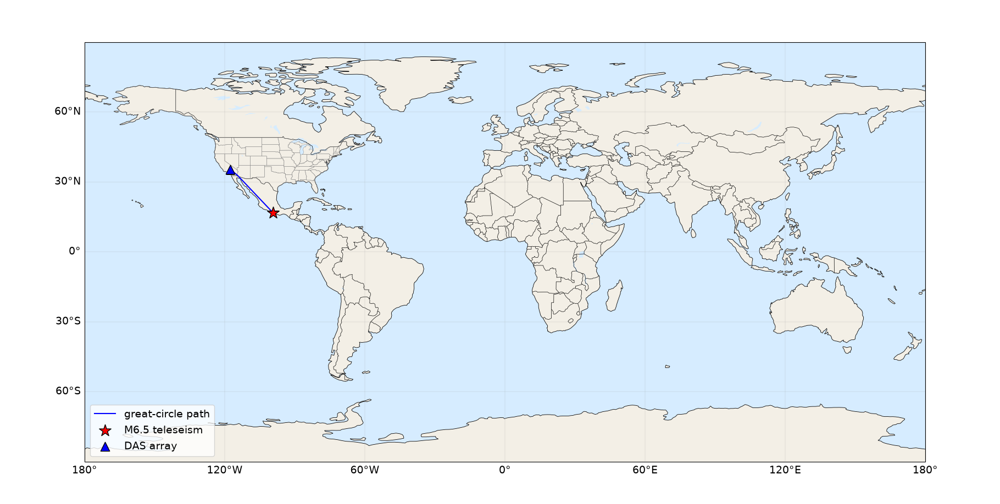

In [12]:
ax = geo_map(extent=None, figsize=(18, 9))
ax.plot([tev["lon"], clon], [tev["lat"], clat], "b-", lw=1.5,
        transform=ccrs.Geodetic(), label="great-circle path")
ax.scatter(tev["lon"], tev["lat"], c="r", s=tev["mag"]*40, marker="*", edgecolors="k",
           zorder=5, transform=ccrs.PlateCarree(), label="M%.1f teleseism" % tev["mag"])
ax.scatter(clon, clat, c="b", s=140, marker="^", edgecolors="k",
           zorder=5, transform=ccrs.PlateCarree(), label="DAS array")
ax.legend(loc="lower left")
ax.set_title("Azimuth %.1f°   Distance %.2f°   M%.1f" % (az, dist_deg, tev["mag"]))

### Travel times (`obspy.taup`)

P / S arrivals from the `iasp91` model, per channel across the array (small moveout at
this distance). Used to overlay the waterfalls and to set the read window.

In [13]:
model = TauPyModel(model="iasp91")
sub = np.linspace(0, good_ch.size - 1, 25).astype(int)       # subset of good-channel indices
P_t = np.zeros(sub.size); S_t = np.zeros(sub.size)
for i, j in enumerate(sub):
    dd = locations2degrees(tev["lat"], tev["lon"], ch_lat[j], ch_lon[j])
    arr = model.get_travel_times(source_depth_in_km=tev["dep"],
                                 distance_in_degree=dd, phase_list=["P", "S"])
    P_t[i] = next(a.time for a in arr if a.name == "P")
    S_t[i] = next(a.time for a in arr if a.name == "S")
P_mean, S_mean = P_t.mean(), S_t.mean()
print(f"P ~ {P_mean:.0f} s,  S ~ {S_mean:.0f} s  (from origin)")

P ~ 319 s,  S ~ 581 s  (from origin)


### Catalog + multi-file read

The P→S→surface window spans **two files**; `DASdb.from_dir` (auto-detects `Proc`) and
`db.read` stitch them. As above we `select_channels` and set `t0_sec` to the origin.

scan: 100%|██████████| 3/3 [00:00<00:00, 1011.81file/s]

DASdb(Proc, 3 files, 2 segments, 2026-01-02 13:35:03.050000+00:00 .. 2026-01-08 05:35:03.040000+00:00)


<Axes: title={'center': 'DASdb(Proc, 3 files, 2 segments, 2026-01-02 13:35:03.050000+00:00 .. 2026-01-08 05:35:03.040000+00:00)'}, xlabel='time'>

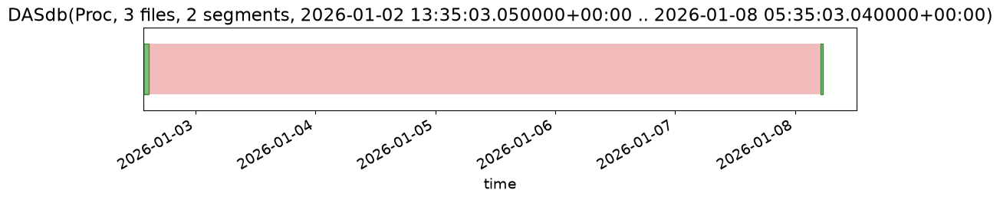

In [14]:
db = DASdb.from_dir("../Inputs")
print(db)
db.plot_timeline()

In [15]:
tstart = teTime + timedelta(seconds=P_mean - 60)
tend   = teTime + timedelta(seconds=S_mean + 300)
spanned = db.df[(db.df.begin_time < tend) & (db.df.end_time > tstart)]
print("spans files:", [p.rsplit("/", 1)[-1] for p in spanned["file"]])

d_tele = db.read(tstart, tend, min_ch=0, max_ch=int(good_ch.max()) + 1).select_channels(good_ch)
d_tele = replace(d_tele, t0_sec=(d_tele.begin_time - teTime).total_seconds())
print("units:", d_tele.units, "| shape:", d_tele.shape)

spans files: ['RidgeCrest-South-2026-01-02T133503Z.h5', 'RidgeCrest-South-2026-01-02T140503Z.h5']
units: microstrain | shape: (8669, 62153)


### Four waterfalls — strain → strain rate → band-passed → common-mode removed

All four panels use `perc=90`, with the P/S travel-time curves overlaid. Each stage is
one `dasio` call chained off the previous, so the processing reads top-to-bottom:
`differentiate` → `bandpass(0.5, 2.0)` → `subtract_common_mode`.

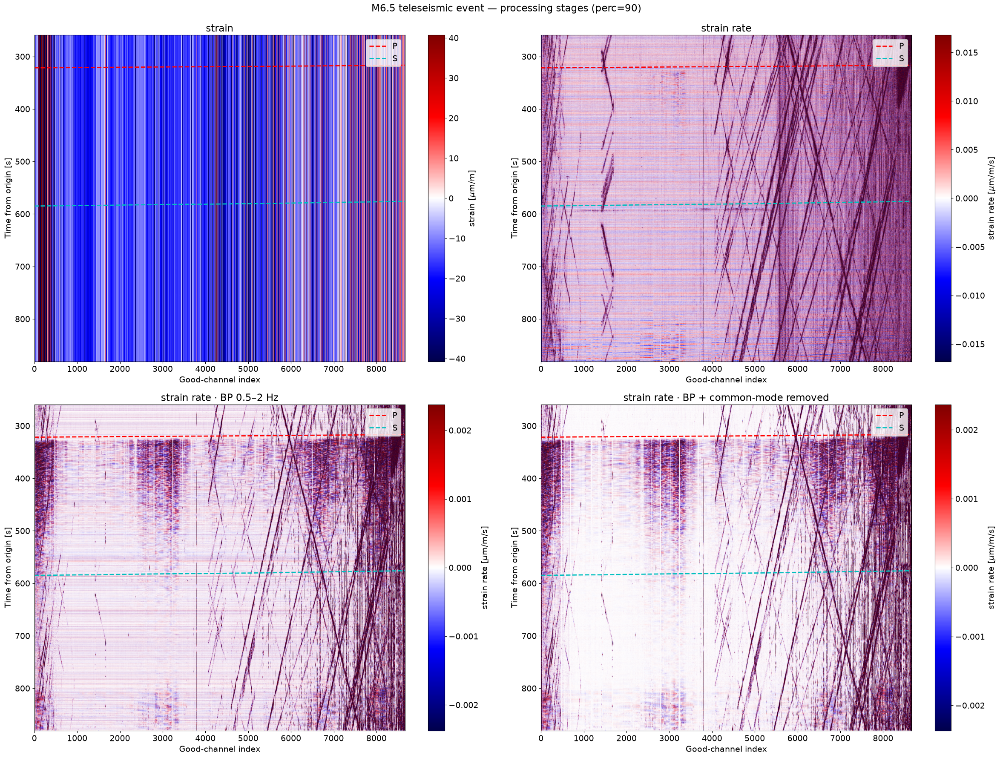

In [16]:
dsr = d_tele.differentiate()                  # strain rate
dbp = dsr.bandpass(0.5, 2.0)                   # + band-pass 0.5–2 Hz
dcm = dbp.subtract_common_mode()              # + common-mode removal

panels = [
    (d_tele, "strain [$\\mu$m/m]",        "strain"),
    (dsr,    "strain rate [$\\mu$m/m/s]", "strain rate"),
    (dbp,    "strain rate [$\\mu$m/m/s]", "strain rate · BP 0.5–2 Hz"),
    (dcm,    "strain rate [$\\mu$m/m/s]", "strain rate · BP + common-mode removed"),
]

fig, axes = plt.subplots(2, 2, figsize=(24, 18))
for (dd, clab, title), axp in zip(panels, axes.ravel()):
    _, im = dd.plot(ax=axp, perc=90, skip_ch=5, skip_t=5)
    axp.plot(sub, P_t, "r--", lw=2, label="P"); axp.plot(sub, S_t, "c--", lw=2, label="S")
    axp.set_title(title); im.colorbar.set_label(clab)
    axp.set_xlabel("Good-channel index"); axp.set_ylabel("Time from origin [s]")
    axp.legend(loc="upper right")
fig.suptitle("M6.5 teleseismic event — processing stages (perc=90)", y=0.99)
fig.tight_layout()

### Single-channel multi-band comparison

Mean strain-rate trace over a 100-channel patch around channel 3000, band-passed into five
bands and stacked (normalized). Long periods (surface waves) dominate late; the body-wave
bands isolate the P and S arrivals.

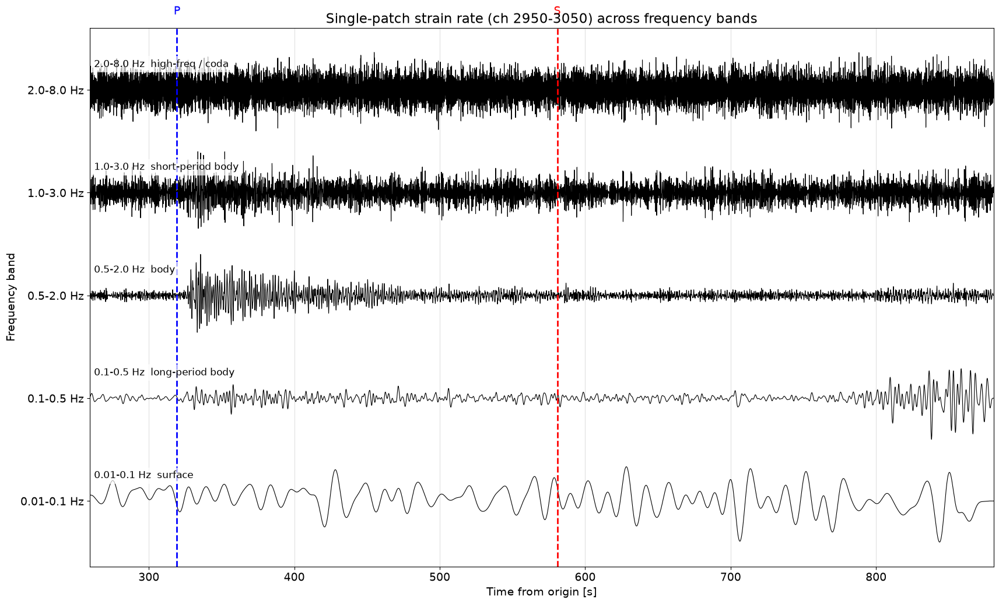

In [17]:
ich, ch_buff = 3000, 50
freq_bands = [
    (0.01, 0.1, "0.01-0.1 Hz  surface"),
    (0.1,  0.5, "0.1-0.5 Hz  long-period body"),
    (0.5,  2.0, "0.5-2.0 Hz  body"),
    (1.0,  3.0, "1.0-3.0 Hz  short-period body"),
    (2.0,  8.0, "2.0-8.0 Hz  high-freq / coda"),
]

g = d_tele.truncate(ch_range=(ich - ch_buff, ich + ch_buff)).differentiate()
t = g.time_axis
spacing = 2.5

fig, ax = plt.subplots(figsize=(20, 12))
for i, (fmin, fmax, label) in enumerate(freq_bands):
    tr = g.bandpass(fmin, fmax).data.mean(axis=0)
    tr = tr / (np.abs(tr).max() + 1e-10)                     # normalize to [-1, 1]
    ax.plot(t, tr + i * spacing, "k", lw=0.8)
    ax.text(t[0] + 3, i * spacing + 0.5, label, fontsize=12, va="bottom",
            bbox=dict(fc="white", ec="none", alpha=0.7))

ax.axvline(P_mean, color="b", ls="--", lw=2)
ax.text(P_mean, 1.02, "P", color="b", ha="center", va="bottom",
        transform=ax.get_xaxis_transform())
ax.axvline(S_mean, color="r", ls="--", lw=2)
ax.text(S_mean, 1.02, "S", color="r", ha="center", va="bottom",
        transform=ax.get_xaxis_transform())

ax.set_yticks([i * spacing for i in range(len(freq_bands))])
ax.set_yticklabels([b[2].split("  ")[0] for b in freq_bands])
ax.set_xlim(t[0], t[-1])
ax.set_xlabel("Time from origin [s]"); ax.set_ylabel("Frequency band")
ax.set_title("Single-patch strain rate (ch 2950-3050) across frequency bands")
ax.grid(axis="x", alpha=0.4)

### Teleseismic wiggle (with P/S markers)

Text(0.5, 1.0, 'Teleseismic wiggle — strain rate, 0.5-2 Hz')

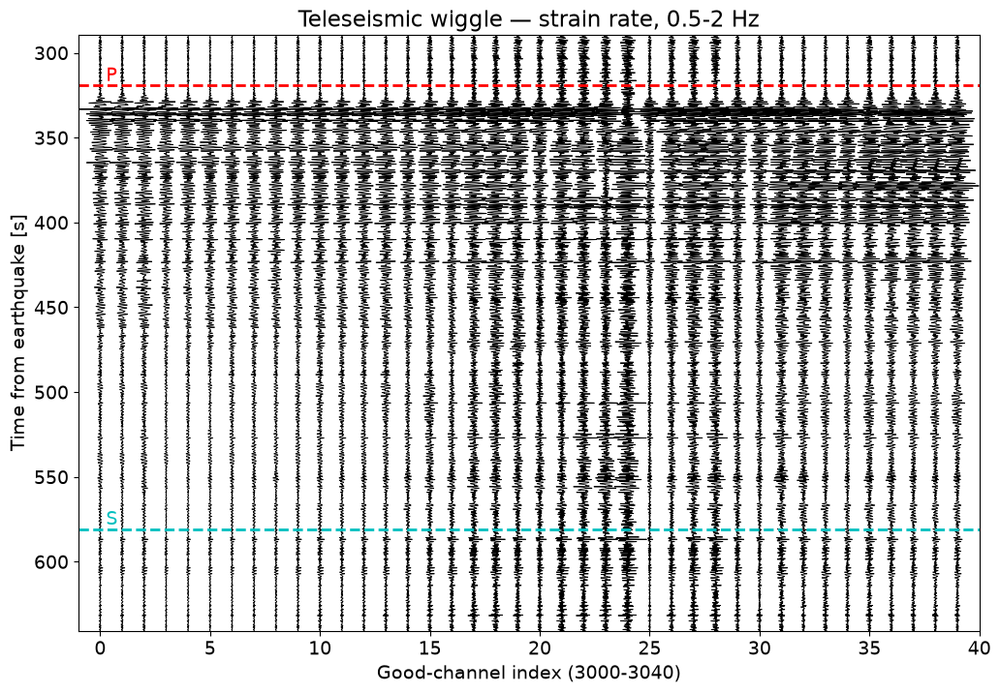

In [18]:
dw = d_tele.truncate(ch_range=(3000, 3040)).differentiate().bandpass(0.5, 2.0)
ax = dw.plot.wiggle(t_range=(P_mean - 30, S_mean + 60), figsize=(12, 8))
ax.axhline(P_mean, color="r", ls="--", lw=2); ax.text(0, P_mean, " P", color="r", va="bottom")
ax.axhline(S_mean, color="c", ls="--", lw=2); ax.text(0, S_mean, " S", color="c", va="bottom")
ax.set_xlabel("Good-channel index (3000-3040)"); ax.set_ylabel("Time from earthquake [s]")
ax.set_title("Teleseismic wiggle — strain rate, 0.5-2 Hz")

## 4. Ambient-noise cross-correlation — virtual-source gather

Beyond earthquakes, the **continuous background wavefield** carries coherent
surface waves. Cross-correlating one channel against its neighbours over many
windows turns that channel into a **virtual source**: the stacked correlation
approximates the Green's function between channels, so a common-shot gather
shows the surface-wave moveout fanning out symmetrically in ±lag.

We use the **two consecutive 30-min files** (the first contiguous block in the
catalog), channels **6700–7300**, virtual source at channel **7000**, in the
**0.5–2.0 Hz** band. `dasio.noise.xcorr_dataset` walks the catalog, runs the
standard CC preprocessing on each window (strain rate → detrend → band-pass →
common-mode removal → running-absolute-mean normalization (1-s window)), cross-correlates every channel
against the source with spectral whitening, and stacks over all 60-s segments.

CCGather(600 pairs x 801 lags, fs=100 Hz, 60 segments)


Text(0.5, 1.0, 'Virtual-source gather @ ch 7000 — ambient noise, 0.5-10 Hz')

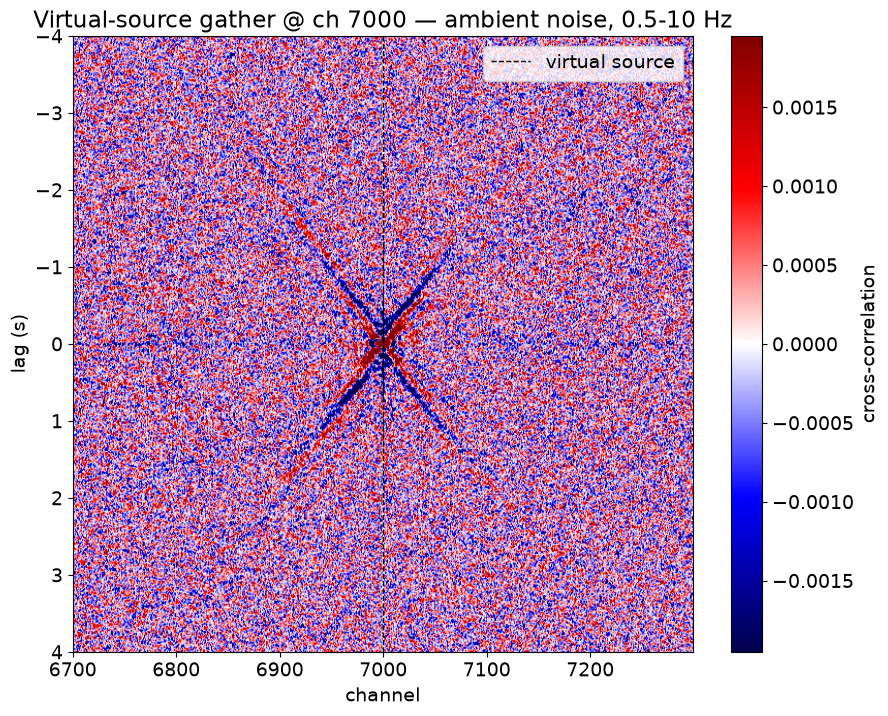

In [19]:
from dasio.noise import common_shot_pairs, xcorr_dataset

CH0, CH1, SRC = 6700, 7300, 7000                       # receiver range, virtual source
seg = next(db.segments())                              # contiguous block = the two 30-min files
cc_begin = seg["begin_time"].iloc[0].to_pydatetime()
cc_end   = seg["end_time"].iloc[-1].to_pydatetime() + timedelta(seconds=1 / seg["fs"].iloc[0])

ch1, ch2 = common_shot_pairs(SRC - CH0, CH1 - CH0)     # source/receiver indices into [CH0, CH1)
preprocessing_kwargs = dict(
    freqmin=0.5, freqmax=10.0, 
    norm_window_sec=0, 
    differentiate=True, detrend=False, 
    subtract_common_mode=True
)
ccg = xcorr_dataset(
    db, ch1, ch2,
    begin=cc_begin, end=cc_end,
    min_ch=CH0, max_ch=CH1,
    seg_sec=60.0, max_lag_sec=4.0, window_sec=1800.0,
    prep=preprocessing_kwargs,
    whiten=True, whiten_band=(1, 2.0),
    device="cuda",
)
print(ccg)

ax, im = ccg.plot(offsets=np.arange(CH0, CH1), perc=98, figsize=(10, 8))
ax.axvline(SRC, color="k", ls="--", lw=1, label="virtual source")
ax.set_xlabel("channel"); ax.legend(loc="upper right")
ax.set_title("Virtual-source gather @ ch 7000 — ambient noise, 0.5-10 Hz")

## Summary

The original workshop, reproduced with `dasio`:

- **Local EQ** — `DASFile(fn).read()` (whole file, microstrain), `select_channels(good_ch)`,
  `replace(t0_sec=…)` to reference the origin, time-windowed `.plot()` /
  `.differentiate().plot()` / `.plot.wiggle()`, and `pick_phases` for automatic
  PhaseNet-DAS+ P/S picks.
- **Teleseism** — `obspy.geodetics` azimuth/distance + `obspy.taup` P/S times;
  `DASdb.from_dir` (auto-detect) + `.plot_timeline()` + `db.read` stitching two files;
  four stacked waterfalls (strain → strain rate → band-pass → common-mode removed, all
  `perc=90`), a single-patch multi-band comparison, and a wiggle.
- **Ambient noise** — `xcorr_dataset` over the two 30-min files: a common-shot
  virtual-source gather at channel 7000 (`common_shot_pairs`, 0.5–2 Hz), showing the
  surface-wave moveout in ±lag.
- **Maps** — one `geo_map()` helper on `cartopy` for both views (coastlines, land/ocean,
  borders, states, USGS Quaternary faults), replacing the original `cartopy`+`basemap`
  split.

See the [`dasio` README](https://github.com/jxli2a/dasio) for the full API.